### Task 3: Preprocessing and Feature engineering - Programming (8 pts.)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import butter, lfilter
import numpy as np

#### Read in audio signals and plot spectrograms

In [2]:
fs, data = wavfile.read('Tinamou.wav')
wt_fs, wt_data = wavfile.read('WhiteThroatedTinamou.wav') # White throated tinamou
gt_fs, gt_data = wavfile.read('GreatTinamou.wav') # Great tinamou

/var/folders/xm/g8279b9x4f9319__gr13r5zh0000gn/T/ipykernel_517/832435108.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, data = wavfile.read('Tinamou.wav')
/var/folders/xm/g8279b9x4f9319__gr13r5zh0000gn/T/ipykernel_517/832435108.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  wt_fs, wt_data = wavfile.read('WhiteThroatedTinamou.wav') # White throated tinamou
/var/folders/xm/g8279b9x4f9319__gr13r5zh0000gn/T/ipykernel_517/832435108.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  gt_fs, gt_data = wavfile.read('GreatTinamou.wav') # Great tinamou


In [3]:
# Transform white throated tinamou audio signal to mono
wt_data = np.mean(wt_data, axis=1)

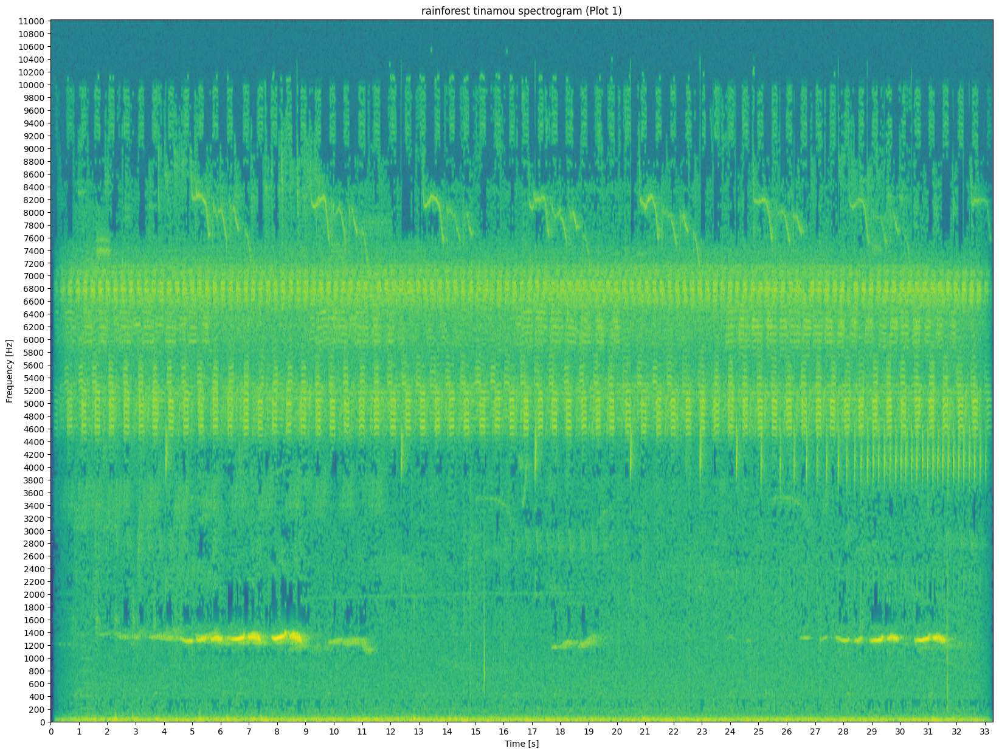

In [4]:
# rainforest tinamou
plt.figure(figsize=(20,15))
plt.specgram(data, Fs=fs, NFFT=1024, noverlap=512)
plt.title('rainforest tinamou spectrogram (Plot 1)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(data)/fs, step=1))
plt.yticks(np.arange(0, fs/2, step=200))
plt.show()

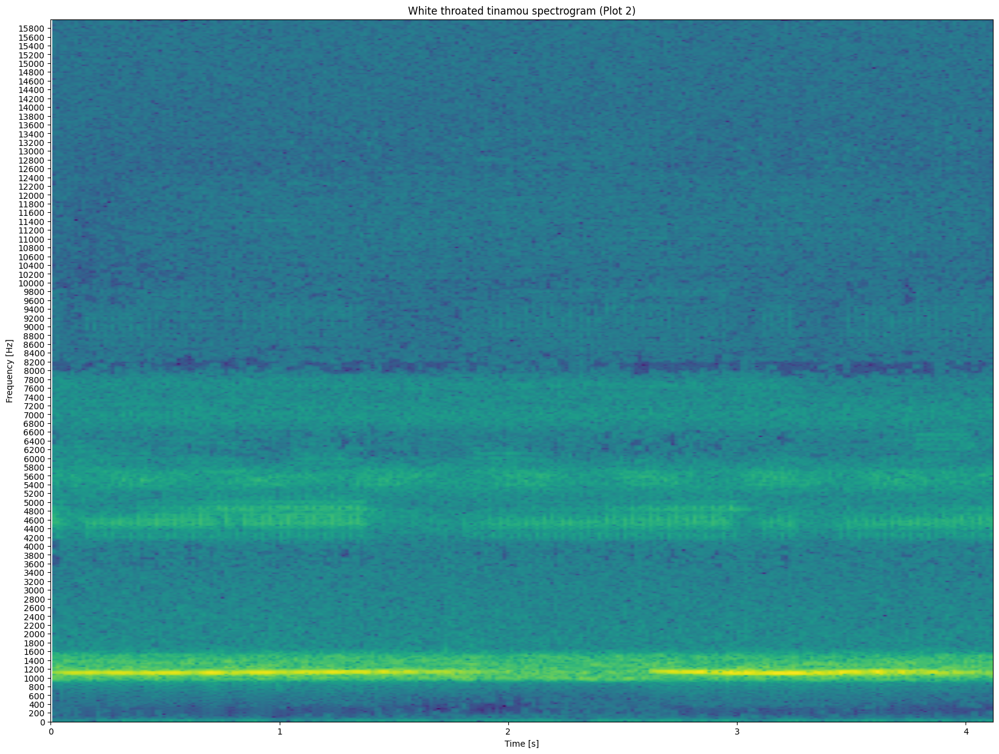

In [5]:
# White throated tinamou
plt.figure(figsize=(20,15))
plt.specgram(wt_data, Fs=wt_fs, NFFT=1024, noverlap=512)
plt.title('White throated tinamou spectrogram (Plot 2)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(wt_data)/wt_fs, step=1))
plt.yticks(np.arange(0, wt_fs/2, step=200))
plt.show()

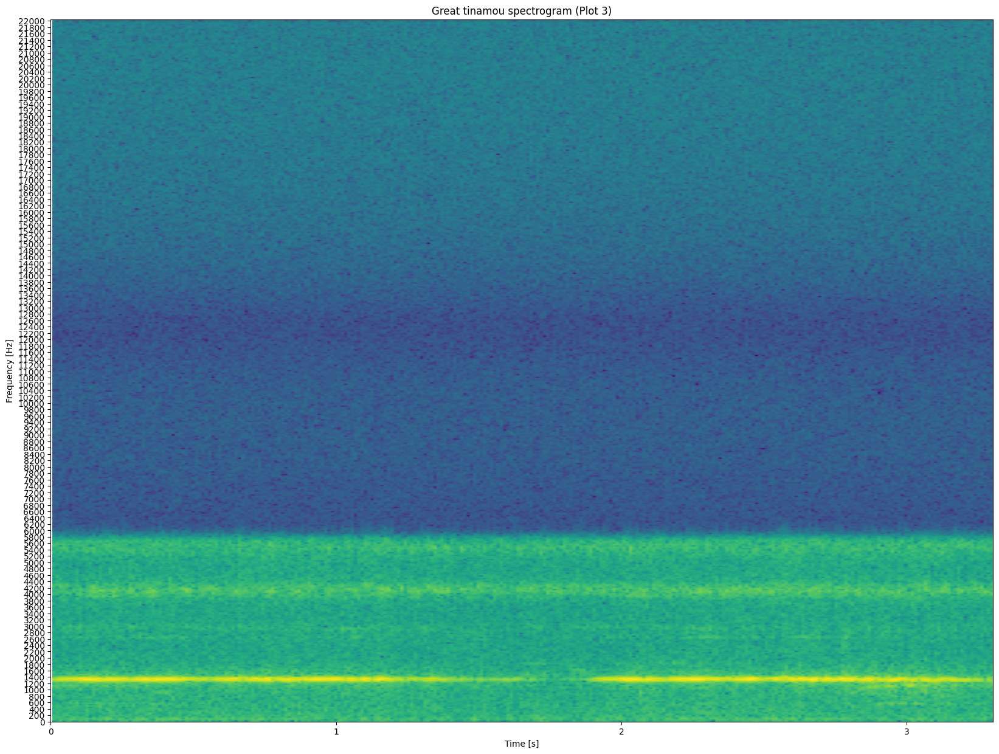

In [6]:
# Great tinamou
plt.figure(figsize=(20,15))
plt.specgram(gt_data, Fs=gt_fs, NFFT=1024, noverlap=512)
plt.title('Great tinamou spectrogram (Plot 3)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(gt_data)/gt_fs, step=1))
plt.yticks(np.arange(0, gt_fs/2, step=200))
plt.show()

#### Filtering

After inspecting the spectrograms of white throated and great tinamou (Plots 2 and 3), I determined that the white throated tinamous' song is in the frequency range [1000, 2000] and the great tinamous' song is in the frequency range [1200, 1400].

I decided to use a bandpass butterworth filter to isolate the birdsong since it is a good way to isolate signals in a specific frequency band.

When filtering the rainforest tinamous' signal I used both [1000, 2000] and [1200, 1400] ranges.

In [7]:
# White throated tinamou
wt_freq = [1000, 1200]

wt_b, wt_a = butter(5, wt_freq, btype='band', fs=wt_fs)
wt_data_filtered = lfilter(wt_b, wt_a, wt_data)

# Write signal to .wav file for testing
wavfile.write('wt_test.wav', wt_fs, wt_data_filtered.astype(np.int16))

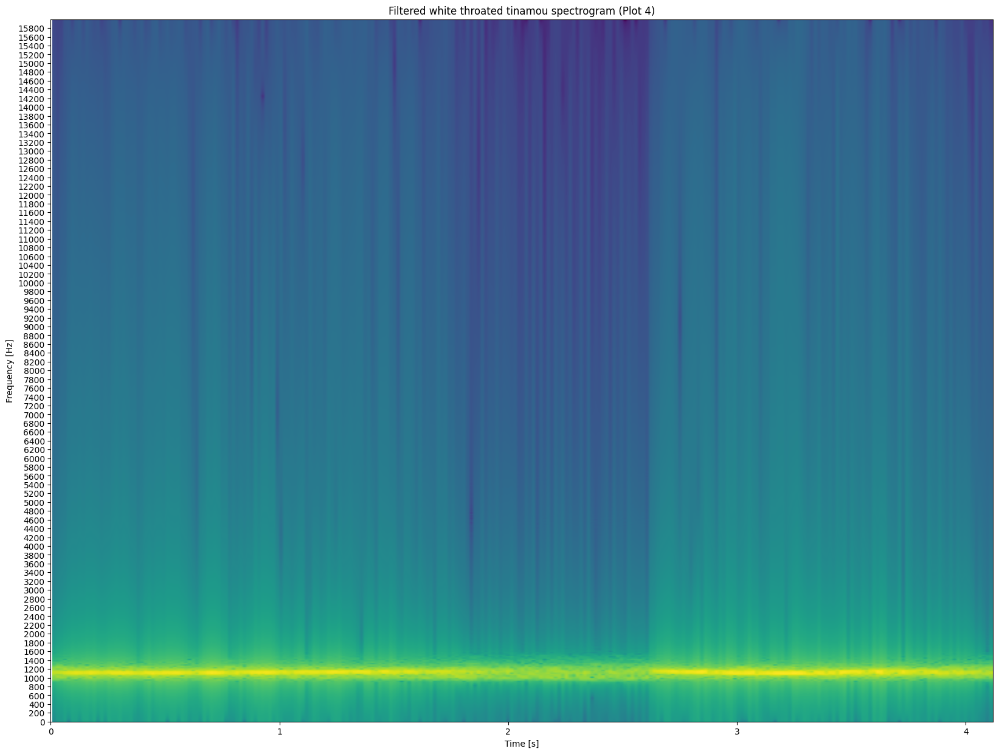

In [8]:
plt.figure(figsize=(20,15))
plt.specgram(wt_data_filtered, Fs=wt_fs, NFFT=1024, noverlap=512)
plt.title('Filtered white throated tinamou spectrogram (Plot 4)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(wt_data_filtered)/wt_fs, step=1))
plt.yticks(np.arange(0, wt_fs/2, step=200))
plt.show()

In [9]:
# Great tinamou
gt_freq = [1200, 1400]

gt_b, gt_a = butter(5, gt_freq, btype='band', fs=gt_fs)
gt_data_filtered = lfilter(gt_b, gt_a, gt_data)

# Write signal to .wav file for testing
wavfile.write('gt_test.wav', gt_fs, gt_data_filtered.astype(np.int16))

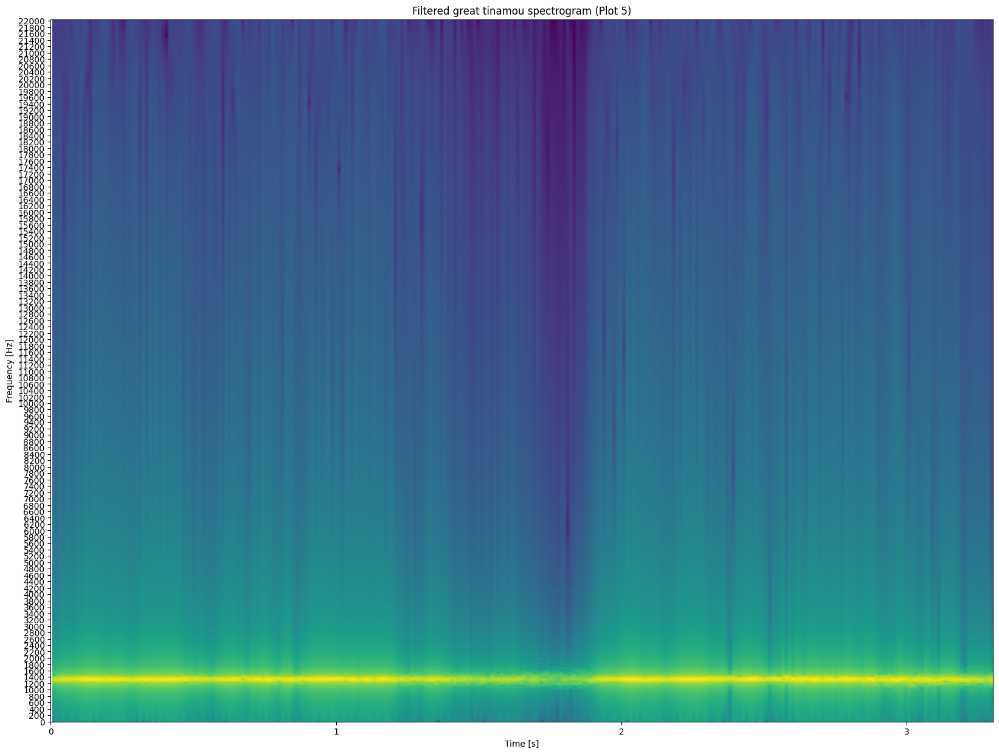

In [10]:
plt.figure(figsize=(20,15))
plt.specgram(gt_data_filtered, Fs=gt_fs, NFFT=1024, noverlap=512)
plt.title('Filtered great tinamou spectrogram (Plot 5)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(gt_data_filtered)/gt_fs, step=1))
plt.yticks(np.arange(0, gt_fs/2, step=200))
plt.show()

In [11]:
# Filter rainforest tinamou with white throated tinamous' frequency range
b1, a1 = butter(5, wt_freq, btype='band', fs=fs)
rf_data_filtered_1 = lfilter(b1, a1, data)

wavfile.write('test1.wav', fs, rf_data_filtered_1.astype(np.int16))

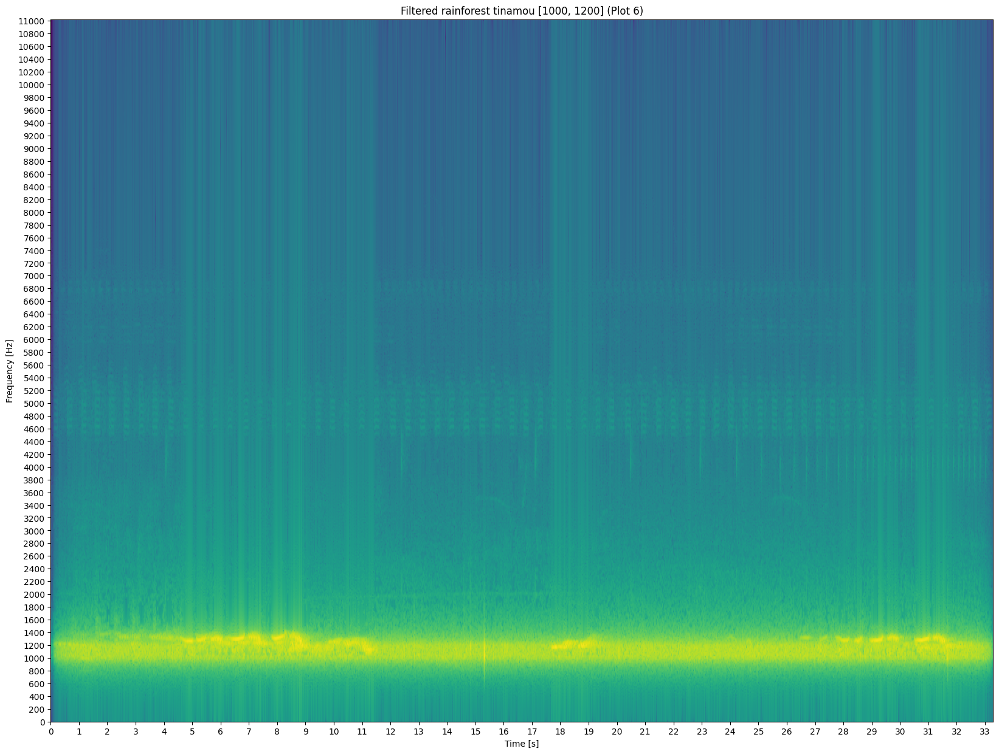

In [12]:
plt.figure(figsize=(20,15))
plt.specgram(rf_data_filtered_1, Fs=fs, NFFT=1024, noverlap=512)
plt.title('Filtered rainforest tinamou [1000, 1200] (Plot 6)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(rf_data_filtered_1) / fs, step=1))
plt.yticks(np.arange(0, fs/2, step=200))
plt.show()

In [13]:
# Filter rainforest tinamou with great tinamous' frequency range
b2, a2 = butter(5, gt_freq, btype='band', fs=fs)
rf_data_filtered_2 = lfilter(b2, a2, data)

wavfile.write('test2.wav', fs, rf_data_filtered_2.astype(np.int16))

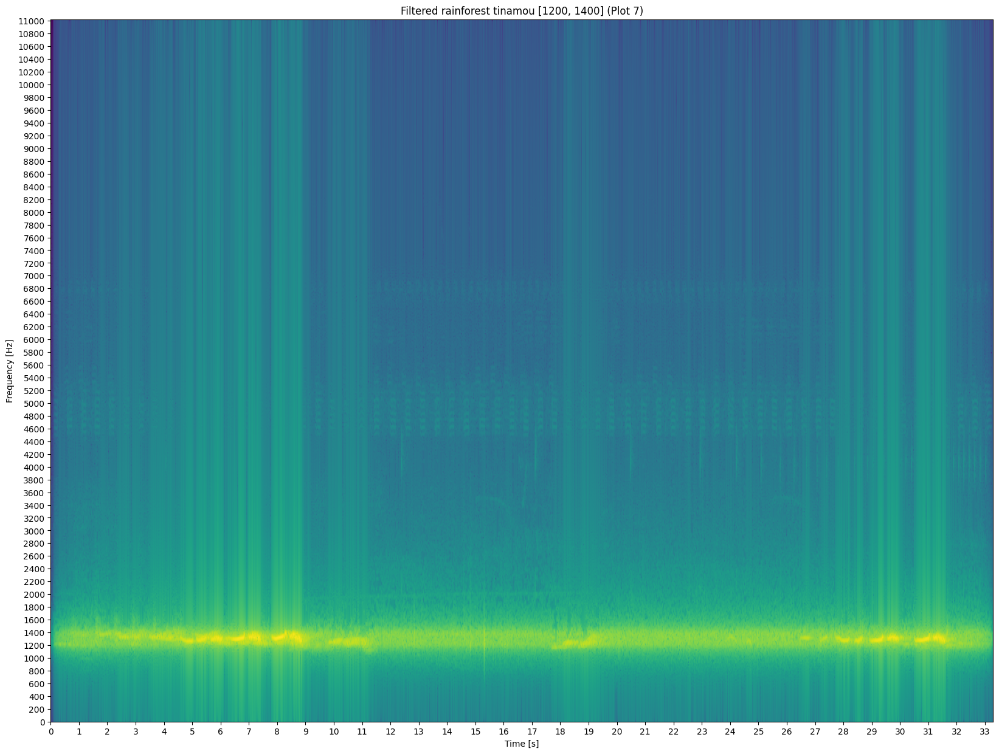

In [14]:
plt.figure(figsize=(20,15))
plt.specgram(rf_data_filtered_2, Fs=fs, NFFT=1024, noverlap=512)
plt.title('Filtered rainforest tinamou [1200, 1400] (Plot 7)')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.xticks(np.arange(0, len(rf_data_filtered_2) / fs, step=1))
plt.yticks(np.arange(0, fs/2, step=200))
plt.show()

After inspecting plots 6 and 7 and listening to the audio files test1.wav and test2.wav I determined that the Great Tinamou [1200, 1400] is in the same frequency with the unknown tinamou.

In [15]:
rf_data_filtered = rf_data_filtered_2

### Similarity

To be sure, I calculate the cross correlation between the two tinamous' and the rainforest tinamou and plot the correlation as a function of lag.

After inspecting plots 8.1 and 8.2 it is clear that the Great tinamou has higher similarity with the rainforest tinamou, compared to the White Throated tinamou.

In [20]:
# Calculate cross correlation between White throated and rainforest tinamou
c1 = np.correlate(wt_data_filtered, rf_data_filtered, mode='valid')
lag1 = np.argmax(c1)

In [21]:
# Calculate cross correlation between great and rainforest tinamou
c2 = np.correlate(gt_data_filtered, rf_data_filtered, mode='valid')
lag2 = np.argmax(c2)

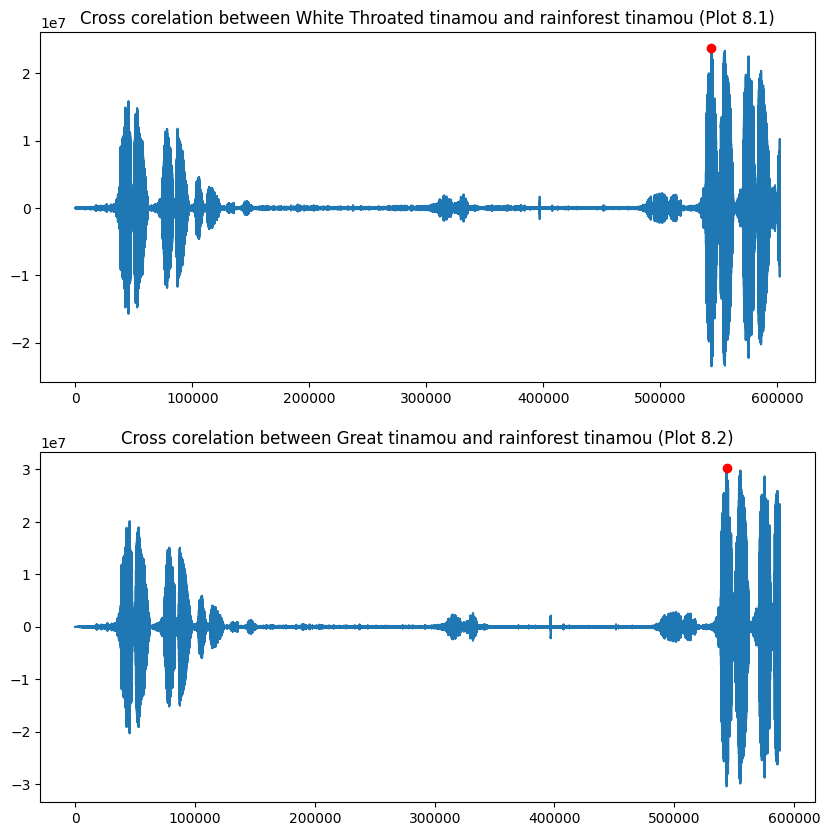

In [27]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,10))

ax1.plot(c1)
ax1.plot(lag1, c1[lag1], marker='o', color='red')
ax1.set_title('Cross corelation between White Throated tinamou and rainforest tinamou (Plot 8.1)')

ax2.plot(c2)
ax2.plot(lag2, c2[lag2], marker='o', color='red')
ax2.set_title('Cross corelation between Great tinamou and rainforest tinamou (Plot 8.2)')

plt.show()